In [1]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
from datetime import datetime
from datetime import timedelta
import matplotlib.cm as cm

# setting things up:

In [2]:
path = Path.cwd()
forcing_path = path / "Forcing"
observations_path = path / "Observations"
output_path = path / "Output"
paths = forcing_path, output_path, observations_path
figure_path = path / "Figures"

In [3]:
units= {"Imax":"mm",
        "Ce": "-",
        "Sumax": "mm",
        "Beta": "-",
        "Pmax": "mm",
        "Tlag": "d",
        "Kf": "-",
        "Ks": "-",
        "FM":'mm/d/degC',
        "Si": "mm",
        "Su": "mm",
        "Sf": "mm",
        "Ss": "mm",
        "Sp": "mm",
        "Ei_dt": "mm/d",
        "Ea_dt": "mm/d",
        "Qs_dt": "mm/d",
        "Qf_dt": "mm/d",
        "Q_tot_dt": "mm/d",
        "Q": "mm/d"}

p_names = ["$I_{max}$",  "$C_e$",  "$Su_{max}$", "β",  "$P_{max}$",  "$T_{lag}$",   "$K_f$",   "$K_s$", "FM"]
S_names = ["Interception storage", "Unsaturated Rootzone Storage", "Fastflow storage", "Groundwater storage", "Snowpack storage"]
names = p_names + S_names
param_names = ["Imax","Ce",  "Sumax", "Beta",  "Pmax",  "Tlag",   "Kf",   "Ks", "FM"]
stor_names = ["Si", "Su", "Sf", "Ss", "Sp"]

var_names =  {x: names[i] for i, x in enumerate(param_names + stor_names)}

In [4]:
def calc_NSE(Qo, Qm):
    QoAv  = np.mean(Qo)
    ErrUp = np.sum((Qo - Qm)**2)
    ErrDo = np.sum((Qo - QoAv)**2)
    return 1 - (ErrUp / ErrDo)
    
def calc_log_NSE(Qo, Qm):
    Qo[Qo == 0] = 1e-6
    QoAv  = np.mean(Qo)
    ErrUp = np.sum((np.log(Qo) - np.log(Qm))**2)
    ErrDo = np.sum((np.log(Qo) - np.log(QoAv))**2)
    return 1 - (ErrUp / ErrDo)

In [5]:
def plot_hydrograph(ds_combined, ax):
    NSE_mean = calc_NSE(ds_combined["Q_obs"].values, ds_combined["Q"].sel(summary_stat="mean").values)
    NSE_mean_log = calc_log_NSE(ds_combined["Q_obs"].values, ds_combined["Q"].sel(summary_stat="mean").values)
    
    ds_combined["Q_obs"].plot(ax=ax,lw=0,marker="*",ms=2.0,zorder=0,label="Observations",color='k')
    
    ds_combined["Q"].sel(summary_stat="mean").plot(ax=ax, color="C1",lw=0.5,label=f"mean NSE: {NSE_mean:.2f}\n   Log NSE: {NSE_mean_log:.2f}",zorder=-1)
    
    ax.fill_between(ds_combined.time, 
                             ds_combined["Q"].sel(summary_stat="min").values,
                             ds_combined["Q"].sel(summary_stat="max").values,color="C0", alpha=0.35,zorder=-10,label="bounds")
    n_particles = ds_combined.attrs['n_particles']
    ax.set_ylabel("Q [mm]")
    ax.set_title(f"Run ensemble of {n_particles} particles");
    return ax

In [6]:
def plot_variable(ds_combined, variable, axs):    
    axs[0] = plot_hydrograph(ds_combined, axs[0])
    n_particles = ds_combined.attrs['n_particles']
    
    for i, var in enumerate(variable):
        axs[i+1].fill_between(ds_combined.time, 
                         ds_combined[var].sel(summary_stat="min").values,
                         ds_combined[var].sel(summary_stat="max").values, color=f"C{i}",alpha=0.5)
        axs[i+1].set_title(var_names[var])
        axs[i+1].set_ylabel(f'{var} [{units[var]}]')
    return axs

# Loading files

In [7]:
files = list((output_path/'w2|5_s1e-2|1e-5').glob('*.nc')) + \
        list((output_path/'first_run').glob('*.nc')) +  \
        list((output_path/'w7|9_s1e-2|1e--7').glob("*.nc")) + \
        list((output_path/'w2|s1e-4, 5e-4_w2.75|s5e-4,1e-3').glob("*.nc"))

In [8]:
forcing_path = Path.cwd() / "Forcing"
HRU_ids = [path.name[1:8] for path in
           forcing_path.glob("*_lump_cida_forcing_leap.txt")]

In [9]:
len(HRU_ids)

26

In [10]:
HRU_ids = list(set([file.name.split('_')[0] for file in files]))

In [11]:
HRU_ids

['01181000',
 '01121000',
 '01031500',
 '01162500',
 '01118300',
 '01123000',
 '01139000',
 '01055000',
 '01013500',
 '01073000',
 '01187300',
 '01030500',
 '04296000',
 '01169000',
 '01052500',
 '01139800',
 '01170100',
 '01137500',
 '01142500',
 '01078000',
 '01144000',
 '01022500',
 '01057000',
 '01054200',
 '01134500',
 '01047000']

In [12]:
dict_files = {}
for file in files:
    sig = file.name.split('_')[1]
    sig = sig[sig.find("-")+1:]
    sig = f"{float(sig):.0e}"
    w = file.name.split('_')[4].split('-')[1]
    dict_files.update(
                       {f"{file.name.split('_')[0]}_{w}_{sig}" : file}
                        )
sorted_iter = sorted(dict_files.keys())[::-1]

In [13]:
hru_ids = set([file.name.split("_")[0] for file in files]).intersection(set(HRU_ids))
len(hru_ids)

26

In [14]:
list(hru_ids)

['01181000',
 '01121000',
 '01031500',
 '01162500',
 '01118300',
 '01123000',
 '01139000',
 '01055000',
 '01013500',
 '01073000',
 '01187300',
 '01030500',
 '04296000',
 '01169000',
 '01052500',
 '01139800',
 '01170100',
 '01137500',
 '01142500',
 '01078000',
 '01144000',
 '01022500',
 '01057000',
 '01054200',
 '01134500',
 '01047000']

In [15]:
len(sorted_iter)

542

In [16]:
lst_ds = []
for key in sorted_iter:
    ds = xr.open_dataset(dict_files[key])
    lst_ds.append(ds)

In [17]:
df = pd.DataFrame(columns=["NSE_mean","NSE_mean_log", "sigma_p_Sf","sigma_w"])
for index, ds_combined in enumerate(lst_ds):
    uid = sorted_iter[index]
    df.loc[uid, 'NSE_mean'] = calc_NSE(ds_combined["Q_obs"].values, ds_combined["Q"].sel(summary_stat="mean").values)
    df.loc[uid, 'NSE_mean_log'] = calc_log_NSE(ds_combined["Q_obs"].values, ds_combined["Q"].sel(summary_stat="mean").values)
    df.loc[uid, 'sigma_p_Sf'] = ds_combined.attrs["sigma_p_Sf"]
    df.loc[uid, 'sigma_w'] = ds_combined.attrs["sigma_w"]

In [18]:
df_count = df[['sigma_p_Sf','sigma_w','NSE_mean','NSE_mean_log']].groupby(['sigma_p_Sf','sigma_w']).count()
df_count

NSE_mean  NSE_mean_log
sigma_p_Sf   sigma_w                        
1.000000e-07 2.00           26            26
             5.00           26            26
             7.00           26            26
             9.00           26            26
1.000000e-05 2.00           26            26
             5.00           26            26
             7.00           26            26
             9.00           25            25
1.000000e-04 2.00           26            26
             3.50           26            26
5.000000e-04 2.00           26            26
             2.75           26            26
1.000000e-03 2.00           26            26
             2.75           26            26
             5.00           26            26
             7.00           25            25
             9.00           25            25
1.000000e-02 2.00           26            26
             5.00           26            26
             7.00           26            26
             9.00           25            25

In [19]:
df = df.sort_values('NSE_mean',ascending=False)
df.head(8)

,NSE_mean,NSE_mean_log,sigma_p_Sf,sigma_w
01013500_2_1e-04,0.778125,0.45516,0.0001,2
01013500_2_1e-02,0.741165,0.302241,0.01,2
01013500_2.75_5e-04,0.731791,0.32162,0.0005,2.75
01013500_2.75_1e-03,0.722179,0.325123,0.001,2.75
01162500_2_1e-04,0.692489,0.55546,0.0001,2
01013500_2_5e-04,0.680633,-0.171449,0.0005,2
01162500_2_1e-05,0.675692,0.515371,0.00001,2
01162500_2.75_1e-03,0.671403,0.563383,0.001,2.75


In [20]:
df.sort_values('NSE_mean_log',ascending=True).head(3)

,NSE_mean,NSE_mean_log,sigma_p_Sf,sigma_w
01052500_2_1e-04,-0.649403,-2.271311,0.0001,2
01137500_2_1e-05,-0.009029,-2.013094,0.00001,2
01137500_9_1e-07,-0.159963,-1.296836,0.0,9


In [21]:
df['HRU_id'] = df.apply(lambda x: x.name.split('_')[0],axis=1)
df['weights'] = df.apply(lambda x: str(df.index[0].split("_")[1]) + "_" +  str(df.index[0].split("_")[2]),axis=1)

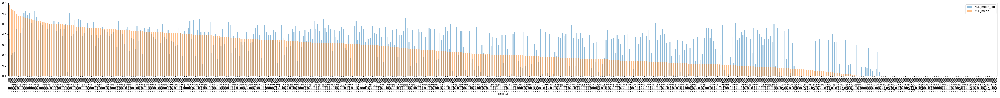

In [22]:
fig, ax = plt.subplots(1,1, sharey=True,figsize=(50,5))
ax=[ax]
df.plot.bar('HRU_id','NSE_mean_log',ax=ax[0],color="C0",alpha=0.5)#lw=0, marker='.',ax=ax[0])
df.plot.bar('HRU_id','NSE_mean',ax=ax[0],color="C1",alpha=0.5) #lw=0, marker='.',ax=ax[0])


# df.plot('sigma_p_Sf','NSE_mean',lw=0, marker='.',ax=ax[1])
# df.plot('sigma_p_Sf','NSE_mean_log',lw=0, marker='.',ax=ax[1])
# ax[0].invert_xaxis()
ax[0].set_ylim(0.1,0.8)
# ax[1].set_xscale('log')
fig.tight_layout()
# ax[0].set_xlim((0,5))
# fig.savefig(figure_path / f'vary_catchments_nse_s.png', bbox_inches="tight",dpi=400)

In [23]:
df.describe(include="all")

,NSE_mean,NSE_mean_log,sigma_p_Sf,sigma_w,HRU_id,weights
count,542.000000,542.00000,542.000,542,542,542
unique,542.000000,542.00000,6.000,6,26,1
top,0.778125,0.45516,0.001,2,01013500,2_1e-04
freq,1.000000,1.00000,128.000,156,21,542


In [24]:
df[df['NSE_mean']>0].agg(
    {

        "NSE_mean": ["min", "max", "median", "skew"],

        "NSE_mean_log": ["min", "max", "median", "mean"],

    }

)

,NSE_mean,NSE_mean_log
min,0.007447,-0.967990
max,0.778125,0.725214
median,0.328431,0.442184
skew,0.165674,NaN
mean,NaN,0.339721


In [25]:
df[['sigma_p_Sf','NSE_mean_log','NSE_mean']].groupby('sigma_p_Sf').mean()

,NSE_mean_log,NSE_mean
sigma_p_Sf,,
1.000000e-07,0.216956,0.271446
1.000000e-05,0.21384,0.277897
1.000000e-04,0.293211,0.390324
5.000000e-04,0.355497,0.411006
1.000000e-03,0.243327,0.302809
1.000000e-02,0.237595,0.279161


In [26]:
df[['sigma_w','NSE_mean_log','NSE_mean']].groupby('sigma_w').mean()

,NSE_mean_log,NSE_mean
sigma_w,,
2.00,0.301756,0.392702
2.75,0.304985,0.396354
3.50,0.301474,0.399842
5.00,0.279,0.346579
7.00,0.187914,0.22872
9.00,0.146509,0.140256


In [27]:
summary = df[['sigma_p_Sf','sigma_w','NSE_mean','NSE_mean_log']].groupby(['sigma_p_Sf','sigma_w']).mean()
summary = summary.sort_index(level=1)

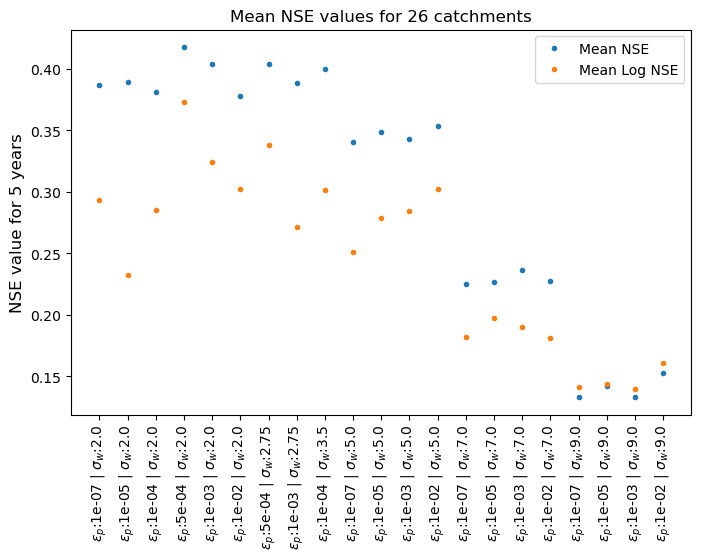

In [28]:
fig, ax = plt.subplots(1,1,figsize=(8,5))
summary.plot(ax=ax,lw=0,marker='.')
ax.set_title("Mean NSE values for 26 catchments")
# ax.set_xlabel("Standard deviation factor of pertubation ($\epsilon_p$) \nand weight ($\sigma_w$) distribution",fontsize='large')
ax.set_xlabel(None)
ax.set_ylabel("NSE value for 5 years",fontsize='large')
ax.set_xticks(range(len(summary)))
ax.set_xticklabels(["$\epsilon_p$:%.e | $\sigma_w$:%s" % item for item in summary.index.tolist()], rotation=90);
# https://stackoverflow.com/questions/21281322/how-to-plot-a-pandas-multiindex-dataframe-with-all-xticks

handels, labels =  ax.get_legend_handles_labels() 
ax.legend(handels, ["Mean NSE", "Mean Log NSE"]);

fig.savefig(figure_path / f'NSE_comparison_26_catchments_1d_more.png', bbox_inches="tight",dpi=100)

In [29]:
plot_summary = summary.reset_index(level=[0,1])
plot_summary = plot_summary.dropna()
plot_summary = plot_summary[plot_summary['NSE_mean'] > 0]
plot_summary = plot_summary[plot_summary['sigma_p_Sf']<0.1]

In [30]:
best = plot_summary[(plot_summary['sigma_p_Sf' ]==0.001) & (plot_summary['sigma_w' ]==2)]
best

,sigma_p_Sf,sigma_w,NSE_mean,NSE_mean_log
4,0.001,2.0,0.403591,0.324479


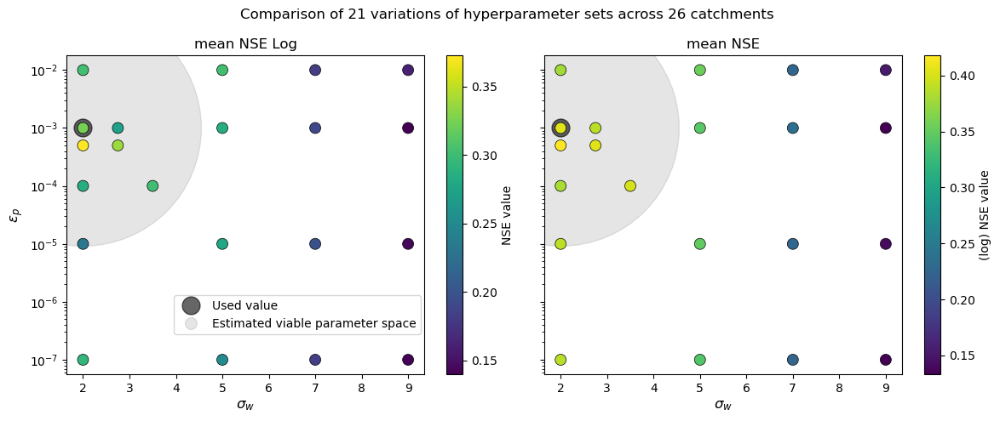

In [31]:
dummy_fig, dummy_ax = plt.subplots(1,1)
dummy_ax.plot(0,0, marker="o",lw=0,ms=10,color="grey",zorder=-10,alpha=0.2, label="optimal value")
handles_other, labels = dummy_ax.get_legend_handles_labels()
plt.close(dummy_fig)

fig, ax = plt.subplots(1,2, sharey=True,figsize=(12,5))
fig.suptitle("Comparison of 21 variations of hyperparameter sets across 26 catchments")
s = 350
cmap = cm.viridis
cb0 = ax[0].scatter(plot_summary['sigma_w'], plot_summary['sigma_p_Sf'], c=plot_summary['NSE_mean_log'], 
                    cmap=cmap, marker='.',s=s, edgecolors='k', linewidth=0.5)
ax[0].set_title('mean NSE Log')
ax[1].set_title('mean NSE')
cb1 = ax[1].scatter(plot_summary['sigma_w'], plot_summary['sigma_p_Sf'], c=plot_summary['NSE_mean'],
                    cmap=cmap, marker='.',s=s, edgecolors='k', linewidth=0.5)
for axs in ax:
    axs.set_xlabel('$\sigma_w$',fontsize="large")
    axs.plot(best['sigma_w'],best['sigma_p_Sf'], marker="o",lw=0,ms=15,color="k",zorder=-10,alpha=0.6, label="Used value")
    axs.plot(best['sigma_w'],best['sigma_p_Sf'], marker="o",lw=0,ms=200,color="grey",zorder=-20,alpha=0.2, label="Estimated viable parameter space")
    # axs.plot(best['sigma_w'],best['sigma_p_Sf'], marker="o",lw=0,ms=2000,color="grey",zorder=-20,alpha=0.5, label="estimated viable parameter space")
ax[0].set_yscale('log')
ax[0].set_ylabel('$\epsilon_p$',fontsize="large")
handles, labels = ax[0].get_legend_handles_labels()
ax[0].legend(handles[:1] + handles_other,labels[:2],loc=(0.3,0.125))

plt.colorbar(cb0,label="NSE value");
plt.colorbar(cb1,label="(log) NSE value");

fig.tight_layout()

fig.savefig(figure_path / f'NSE_comparison_26_catchments_2d_more.png', bbox_inches="tight",dpi=150)

(0.0, 1.0)

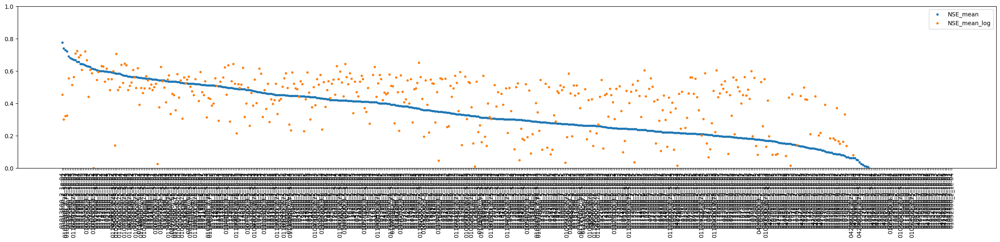

In [32]:
selection_df = df[(df['sigma_p_Sf'] != 0.1)]
fig,ax = plt.subplots(1,1,figsize=(30,5))
selection_df[['NSE_mean','NSE_mean_log']].plot(lw=0,marker='.',ax=ax)
ax.set_xticks(range(len(selection_df)))
ax.set_xticklabels(selection_df.index,rotation=90);
ax.set_ylim(0,1)

(0.0, 1.0)

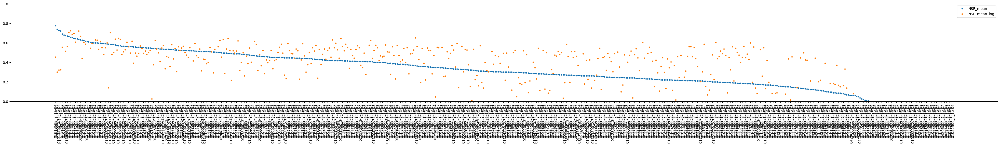

In [33]:
selection_df = df[(df['sigma_p_Sf'] != 0.1)]
fig,ax = plt.subplots(1,1,figsize=(50,5))
selection_df[['NSE_mean','NSE_mean_log']].plot(lw=0,marker='.',ax=ax)
ax.set_xticks(range(len(selection_df)))
ax.set_xticklabels(selection_df.index,rotation=90);
ax.set_ylim(0,1)

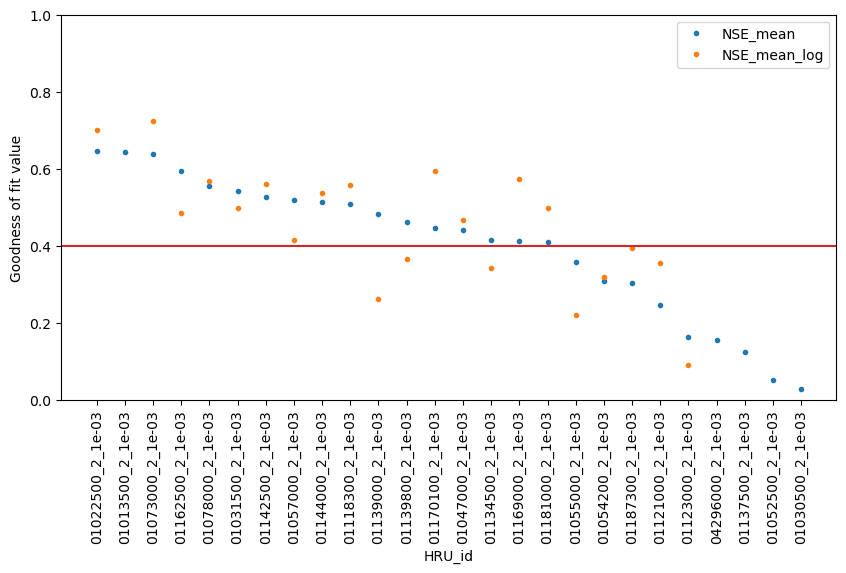

In [34]:
selection_df = df[(df['sigma_p_Sf'] == 0.001) & (df['sigma_w'] == 2)]
fig,ax = plt.subplots(1,1,figsize=(10,5))

selection_df_plot = selection_df.set_index('HRU_id')
selection_df_plot[['NSE_mean','NSE_mean_log']].plot(lw=0,marker='.',ax=ax)
ax.set_xticks(range(len(selection_df)))
ax.set_xticklabels(selection_df.index,rotation=90);
ax.set_ylim(0,1)
ax.axhline(0.4,color="C3");
ax.set_ylabel("Goodness of fit value");

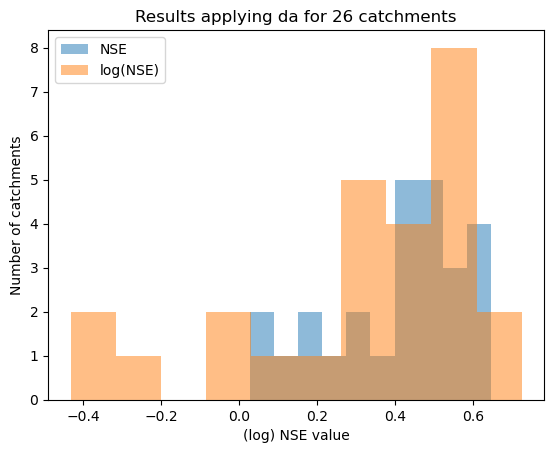

In [35]:
fig, ax = plt.subplots(1,1)
ax.hist(selection_df_plot['NSE_mean'],color="C0",alpha=0.5,label="NSE");
ax.hist(selection_df_plot['NSE_mean_log'],color="C1",alpha=0.5, label="log(NSE)");
ax.legend()
ax.set_ylabel('Number of catchments')
ax.set_xlabel("(log) NSE value");
title = f"Results applying da for {len(selection_df_plot)} catchments"
ax.set_title(title);
title = title.replace(" ", '_')
fig.savefig(figure_path / (title + '.png'))

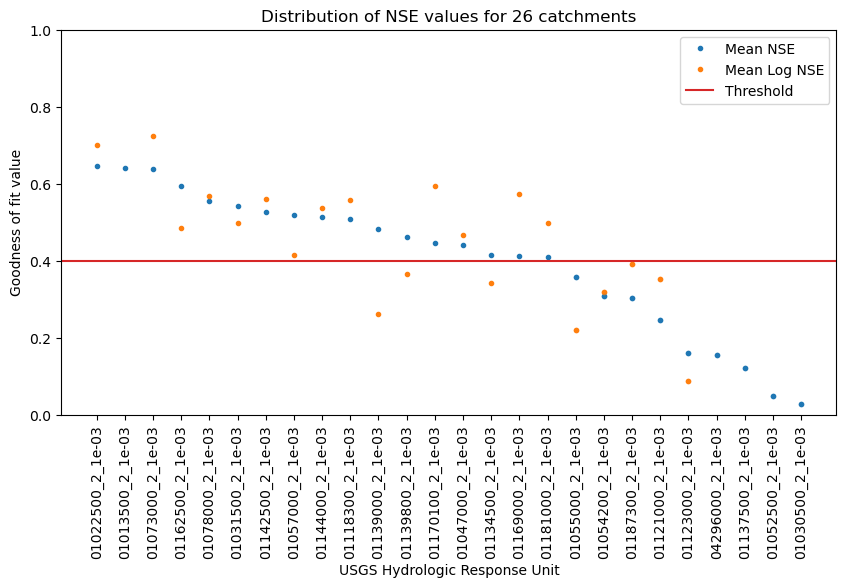

In [36]:

selection_df = df[(df['sigma_p_Sf'] == 0.001) & (df['sigma_w'] == 2)].copy()
selection_df_plot = selection_df.set_index('HRU_id')
selection_df_plot['dropped'] = selection_df_plot.apply(lambda x: np.nan if x.NSE_mean < 0.4 and x.NSE_mean_log < 0.4 else 0, axis=1)

selection_df_dopped = df[(df['sigma_p_Sf'] == 0.001) & (df['sigma_w'] == 2)].copy()
selection_df_dopped = selection_df_dopped.set_index('HRU_id')
selection_df_dopped['NSE_mean'] = selection_df_dopped.apply(lambda x: x.NSE_mean if x.NSE_mean < 0.4 and x.NSE_mean_log < 0.4 else np.nan, axis=1)
selection_df_dopped['NSE_mean_log'] = selection_df_dopped.apply(lambda x: x.NSE_mean_log if x.NSE_mean < 0.4 and x.NSE_mean_log < 0.4 else np.nan, axis=1)

selected_df = selection_df.dropna()
# selection_df_dopped = selection_df_dopped.dropna()


fig,ax = plt.subplots(1,1,figsize=(10,5))
selection_df_plot[['NSE_mean','NSE_mean_log']].plot(lw=0,marker='.',ax=ax)
ax.axhline(0.4,color="C3",label="Threshold")

selection_df_dopped[['NSE_mean']].plot(lw=0,marker='.',ax=ax,color="C0",alpha=0.5)
selection_df_dopped[['NSE_mean_log']].plot(lw=0,marker='.',ax=ax,color="C1",alpha=0.5)
ax.set_xticks(range(len(selection_df)))
ax.set_xticklabels(selection_df.index,rotation=90);
ax.set_ylim(0,1)
ax.set_ylabel("Goodness of fit value")
ax.set_xlabel("USGS Hydrologic Response Unit")


handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:3],["Mean NSE", "Mean Log NSE","Threshold"])
title = "Distribution of NSE values for 26 catchments"
ax.set_title(title);

fig.savefig(figure_path / (title + 'png'), bbox_inches="tight",dpi=400)

In [40]:
len(selected_df)

26

In [50]:
selection_df_dopped = selection_df_dopped.dropna()
selection_df_dopped['key'] = selection_df_dopped.apply(lambda x: f'{x.name}_{x.weights}',axis=1)


/tmp/ipykernel_441618/4200432185.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selection_df_dopped['key'] = selection_df_dopped.apply(lambda x: f'{x.name}_{x.weights}',axis=1)


In [55]:
df

,NSE_mean,NSE_mean_log,sigma_p_Sf,sigma_w,HRU_id,weights
01013500_2_1e-04,0.778125,0.45516,0.0001,2,01013500,2_1e-04
01013500_2_1e-02,0.741165,0.302241,0.01,2,01013500,2_1e-04
01013500_2.75_5e-04,0.731791,0.32162,0.0005,2.75,01013500,2_1e-04
01013500_2.75_1e-03,0.722179,0.325123,0.001,2.75,01013500,2_1e-04
01162500_2_1e-04,0.692489,0.55546,0.0001,2,01162500,2_1e-04
...,...,...,...,...,...,...
04296000_7_1e-07,-0.155051,-0.772436,0.0,7,04296000,2_1e-04
01137500_9_1e-07,-0.159963,-1.296836,0.0,9,01137500,2_1e-04
01052500_2_1e-07,-0.182351,-0.447055,0.0,2,01052500,2_1e-04
01052500_2_1e-02,-0.275183,-0.862302,0.01,2,01052500,2_1e-04


In [51]:
paths_analysed_ds = []
for key in selection_df_dopped.key:
    paths_analysed_ds.append(dict_files[key])

In [52]:
len(paths_analysed_ds)

9

In [53]:
paths_analysed_ds

[PosixPath('/media/davidhaasnoot/files/work/Studie TUD/Msc/Year 6/Q3 Thesis/Code/eWaterCycle-WSL-WIP/nbs_39_formalise_algorithm/Output/w2|s1e-4, 5e-4_w2.75|s5e-4,1e-3/01055000_psf-0.0001_pp-0_ps-0_w-2_N-500_2024-05-23 00_01.nc'),
 PosixPath('/media/davidhaasnoot/files/work/Studie TUD/Msc/Year 6/Q3 Thesis/Code/eWaterCycle-WSL-WIP/nbs_39_formalise_algorithm/Output/w2|s1e-4, 5e-4_w2.75|s5e-4,1e-3/01054200_psf-0.0001_pp-0_ps-0_w-2_N-500_2024-05-22 22_33.nc'),
 PosixPath('/media/davidhaasnoot/files/work/Studie TUD/Msc/Year 6/Q3 Thesis/Code/eWaterCycle-WSL-WIP/nbs_39_formalise_algorithm/Output/w2|s1e-4, 5e-4_w2.75|s5e-4,1e-3/01187300_psf-0.0001_pp-0_ps-0_w-2_N-500_2024-05-24 01_02.nc'),
 PosixPath('/media/davidhaasnoot/files/work/Studie TUD/Msc/Year 6/Q3 Thesis/Code/eWaterCycle-WSL-WIP/nbs_39_formalise_algorithm/Output/w2|s1e-4, 5e-4_w2.75|s5e-4,1e-3/01121000_psf-0.0001_pp-0_ps-0_w-2_N-500_2024-05-23 07_23.nc'),
 PosixPath('/media/davidhaasnoot/files/work/Studie TUD/Msc/Year 6/Q3 Thesis/Code

#### best 25

In [89]:
best_25 = df.sort_values('NSE_mean_log',ascending=False).head(25)
best_25

,NSE_mean,NSE_mean_log,sigma_p_Sf,sigma_w,HRU_id,weights
01073000_2_1e-02,0.658984,0.725214,0.01,2,01073000,2_1e-04
01073000_2_1e-03,0.637625,0.724063,0.001,2,01073000,2_1e-04
01073000_2_1e-07,0.667007,0.708946,0.0,2,01073000,2_1e-04
01022500_2.75_5e-04,0.586241,0.70777,0.0005,2.75,01022500,2_1e-04
01022500_2_1e-03,0.645867,0.700359,0.001,2,01022500,2_1e-04
01073000_2_1e-04,0.65877,0.687479,0.0001,2,01073000,2_1e-04
01022500_3.5_1e-04,0.632546,0.66946,0.0001,3.5,01022500,2_1e-04
01181000_2_5e-04,0.36827,0.652355,0.0005,2,01181000,2_1e-04
01073000_2.75_5e-04,0.571904,0.647458,0.0005,2.75,01073000,2_1e-04
01181000_3.5_1e-04,0.419153,0.646047,0.0001,3.5,01181000,2_1e-04


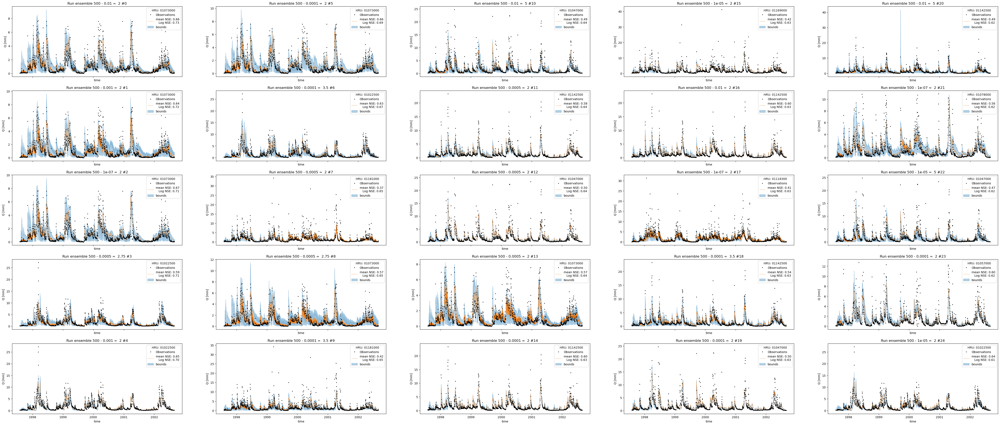

In [90]:
y1, x1   = 5,5
fig, axs_2d = plt.subplots(y1,x1,figsize=(12*x1,5*y1), sharex=True)
j = 0
k = 0
for i in range(0,x1*y1):
    if k >= y1: 
        j += 1
        k = 0
    ax = axs_2d[k, j]
    k += 1

    if i >= len(lst_ds):
        ax.axis('off')
    else:
        ds_combined = lst_ds[sorted_iter.index(best_25.index[i])]
        ax = plot_hydrograph(ds_combined, ax)
        ax.set_title(f'Run ensemble {ds_combined.attrs["n_particles"]} - {ds_combined.attrs["sigma_p_Sf"]} =  {ds_combined.attrs["sigma_w"]} #{i}')
        # if k == 1:
        ax.legend(title=f"HRU: {ds_combined.attrs['HRU_id']}")
        # else:
            # ax.legend()

# fig.savefig(figure_path / f'vary_catchments.png', bbox_inches="tight",dpi=400)

#### Best 25 w=2,s=1e-3

In [91]:
df_best_2_1e3 = df[df['sigma_w'] == 2]
df_best_2_1e3 = df_best_2_1e3[df_best_2_1e3['sigma_p_Sf']==0.001]
df_best_2_1e3

,NSE_mean,NSE_mean_log,sigma_p_Sf,sigma_w,HRU_id,weights
01022500_2_1e-03,0.645867,0.700359,0.001,2,01022500,2_1e-04
01013500_2_1e-03,0.642295,-0.030234,0.001,2,01013500,2_1e-04
01073000_2_1e-03,0.637625,0.724063,0.001,2,01073000,2_1e-04
01162500_2_1e-03,0.594698,0.48452,0.001,2,01162500,2_1e-04
01078000_2_1e-03,0.554328,0.568478,0.001,2,01078000,2_1e-04
01031500_2_1e-03,0.542902,0.498884,0.001,2,01031500,2_1e-04
01142500_2_1e-03,0.526547,0.561212,0.001,2,01142500,2_1e-04
01057000_2_1e-03,0.519463,0.415454,0.001,2,01057000,2_1e-04
01144000_2_1e-03,0.513726,0.537219,0.001,2,01144000,2_1e-04
01118300_2_1e-03,0.509386,0.556945,0.001,2,01118300,2_1e-04


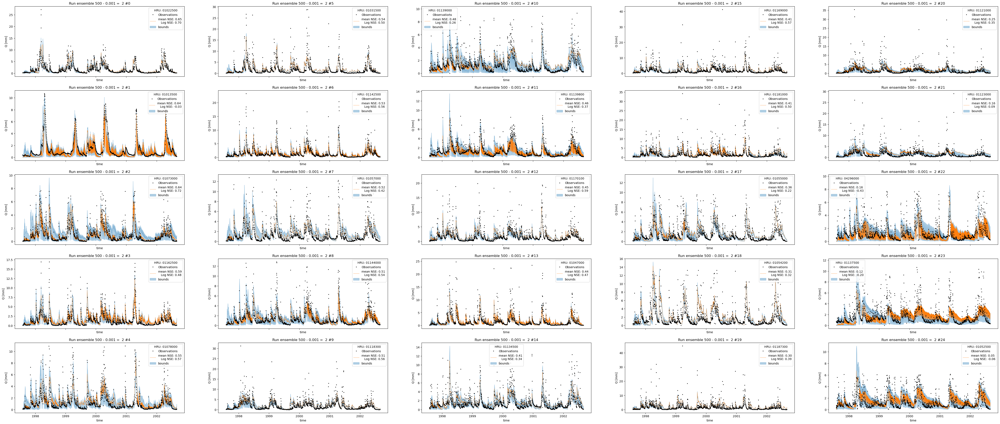

In [92]:
y1, x1   = 5,5
fig, axs_2d = plt.subplots(y1,x1,figsize=(12*x1,5*y1), sharex=True)
j = 0
k = 0
for i in range(0,x1*y1):
    if k >= y1: 
        j += 1
        k = 0
    ax = axs_2d[k, j]
    k += 1

    if i >= len(lst_ds):
        ax.axis('off')
    else:
        ds_combined = lst_ds[sorted_iter.index(df_best_2_1e3.index[i])]
        ax = plot_hydrograph(ds_combined, ax)
        ax.set_title(f'Run ensemble {ds_combined.attrs["n_particles"]} - {ds_combined.attrs["sigma_p_Sf"]} =  {ds_combined.attrs["sigma_w"]} #{i}')
        # if k == 1:
        ax.legend(title=f"HRU: {ds_combined.attrs['HRU_id']}")
        # else:
            # ax.legend()

# fig.savefig(figure_path / f'vary_catchments.png', bbox_inches="tight",dpi=400)

### Best 25 w=2,s=5e-4

In [93]:
df_best_2_5e4 = df[df['sigma_w'] == 2]
df_best_2_5e4 = df_best_2_5e4[df_best_2_5e4['sigma_p_Sf']==0.0005]

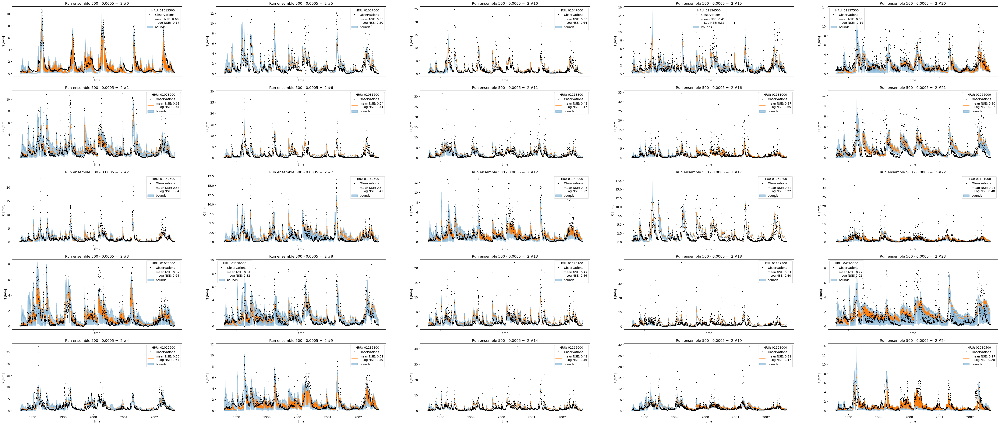

In [94]:
y1, x1   = 5,5
fig, axs_2d = plt.subplots(y1,x1,figsize=(12*x1,5*y1), sharex=True)
j = 0
k = 0
for i in range(0,x1*y1):
    if k >= y1: 
        j += 1
        k = 0
    ax = axs_2d[k, j]
    k += 1

    if i >= len(lst_ds):
        ax.axis('off')
    else:
        ds_combined = lst_ds[sorted_iter.index(df_best_2_5e4.index[i])]
        ax = plot_hydrograph(ds_combined, ax)
        ax.set_title(f'Run ensemble {ds_combined.attrs["n_particles"]} - {ds_combined.attrs["sigma_p_Sf"]} =  {ds_combined.attrs["sigma_w"]} #{i}')
        # if k == 1:
        ax.legend(title=f"HRU: {ds_combined.attrs['HRU_id']}")
        # else:
            # ax.legend()

# fig.savefig(figure_path / f'vary_catchments.png', bbox_inches="tight",dpi=400)

# Good example:

In [95]:
i = sorted_iter.index('01073000_2_1e-03')
ds_combined = lst_ds[i]
ds_combined

<xarray.Dataset> Size: 728kB
Dimensions:       (summary_stat: 3, time: 1857)
Coordinates:
  * summary_stat  (summary_stat) <U4 48B 'min' 'max' 'mean'
  * time          (time) datetime64[ns] 15kB 1997-08-01 ... 2002-08-31
Data variables: (12/18)
    Imax          (summary_stat, time) float64 45kB ...
    Ce            (summary_stat, time) float64 45kB ...
    Sumax         (summary_stat, time) float64 45kB ...
    Beta          (summary_stat, time) float64 45kB ...
    Pmax          (summary_stat, time) float64 45kB ...
    Tlag          (summary_stat, time) float64 45kB ...
    ...            ...
    Ss            (summary_stat, time) float64 45kB ...
    Sp            (summary_stat, time) float64 45kB ...
    Q             (summary_stat, time) float64 45kB ...
    Q_obs         (time) float64 15kB 0.06248 0.04999 0.05233 ... 0.1172 0.04686
    Neff          (time) float64 15kB ...
    n_resample    (time) float64 15kB ...
Attributes: (12/13)
    title:              HBV storage & parameter terms data over time for 500 ...
    history:            Storage term results from ewatercycle_HBV.model
    sigma_pp:           0
    sigma_ps:           0
    sigma_w:            2
    sigma_p_Sf:         0.001
    ...                 ...
    n_particles:        500
    HRU_id:             01073000
    p_min_initial:      [1.38271498e+00 2.07225353e-01 9.57184630e+01 6.31605...
    p_max_initial:      [7.29577260e+00 9.15790021e-01 5.94806582e+02 3.89947...
    s_max_initial:      [  4.67111431 329.82576609 111.49470142  26.12225512 ...
    s_min_initial:      [ 0.66224652 52.98945943 10.36909498  1.67897653  8.6...

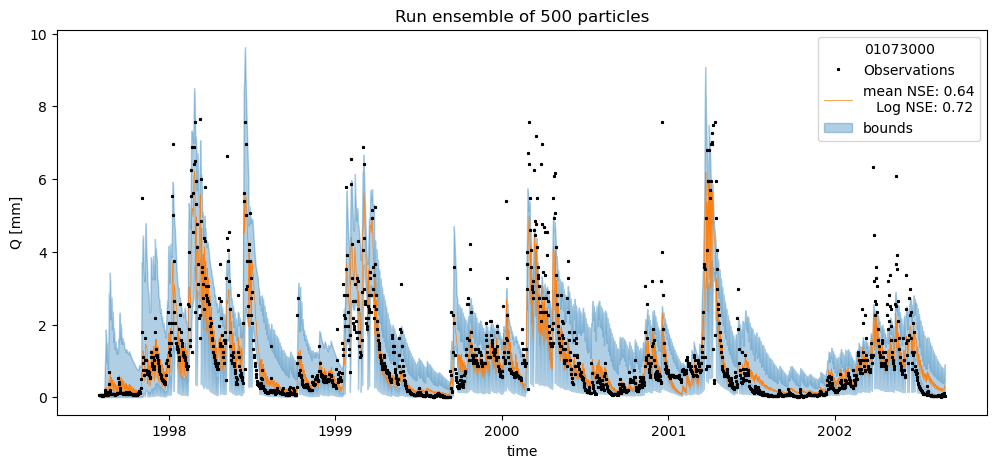

In [96]:
fig, ax = plt.subplots(1,1, figsize=(12,5),sharex=True)
ax = plot_hydrograph(ds_combined, ax)
ax.legend(title=ds_combined.attrs['HRU_id'])
current_time = str(datetime.now())[:-10].replace(":","_")
# fig.savefig(figure_path / f"Ensemble run for {ds_combined.attrs['HRU_id']}_{ds_combined.attrs['n_particles']}_{current_time}.png",bbox_inches="tight", dpi=600)

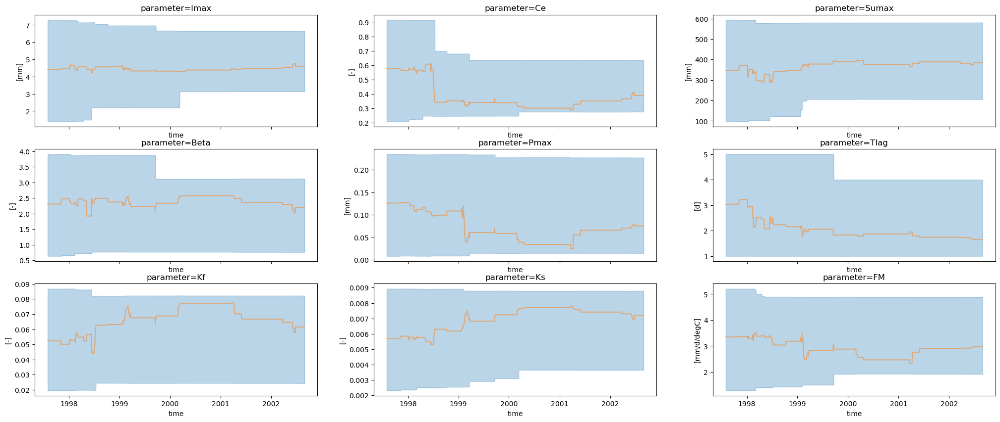

In [97]:
fig, axs = plt.subplots(3,3,figsize=(25,10),sharex=True)
axs = axs.flatten()
for j, parameter in enumerate(param_names):
    ax = axs[j]
    n_particles = ds_combined.attrs['n_particles']
    ds_combined[parameter].sel(summary_stat="mean").plot(ax=ax,alpha=0.5,color="C1")
    ax.fill_between(ds_combined.time, 
                     ds_combined[parameter].sel(summary_stat="min").values,
                     ds_combined[parameter].sel(summary_stat="max").values,alpha=0.3, color="C0")
    ax.set_title(f'parameter={parameter}')# for {n_particles} Ensemble Members')
    ax.set_ylabel(f'[{units[param_names[j]]}]')

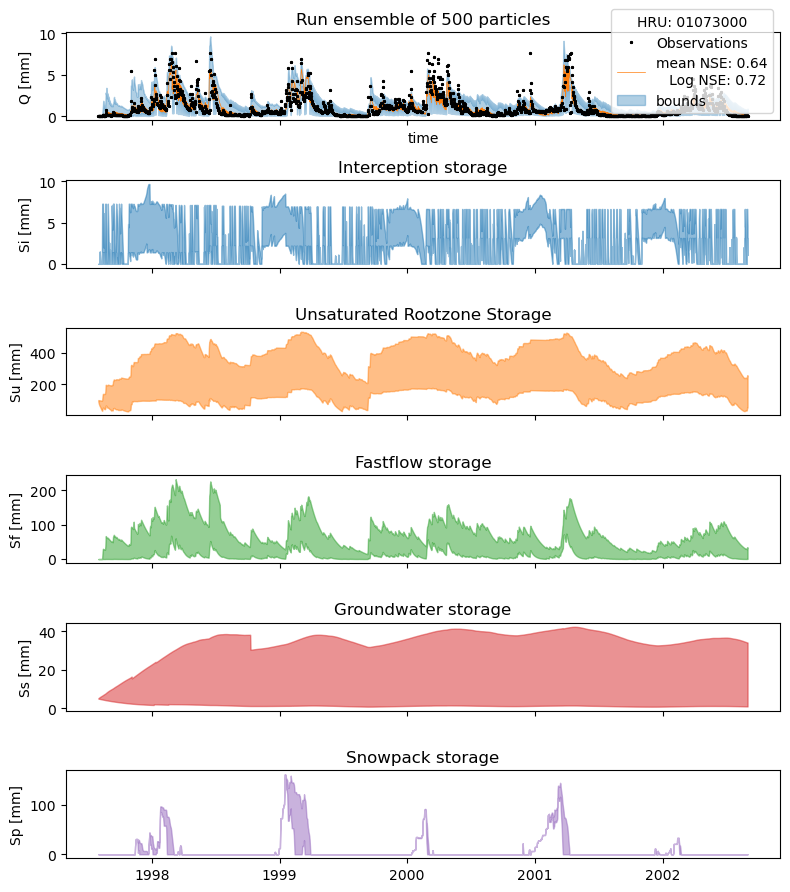

In [98]:
n=6
fig, axs = plt.subplots(n,1,figsize=(8,n*1.5),sharex=True)
plot_variable(ds_combined, stor_names, axs)
fig.tight_layout()
axs[0].legend(title=f"HRU: {ds_combined.attrs['HRU_id']}")
# fig.savefig(figure_path / (str(files[i].name[:-3]) + '_storages.png'), bbox_inches="tight",dpi=400)

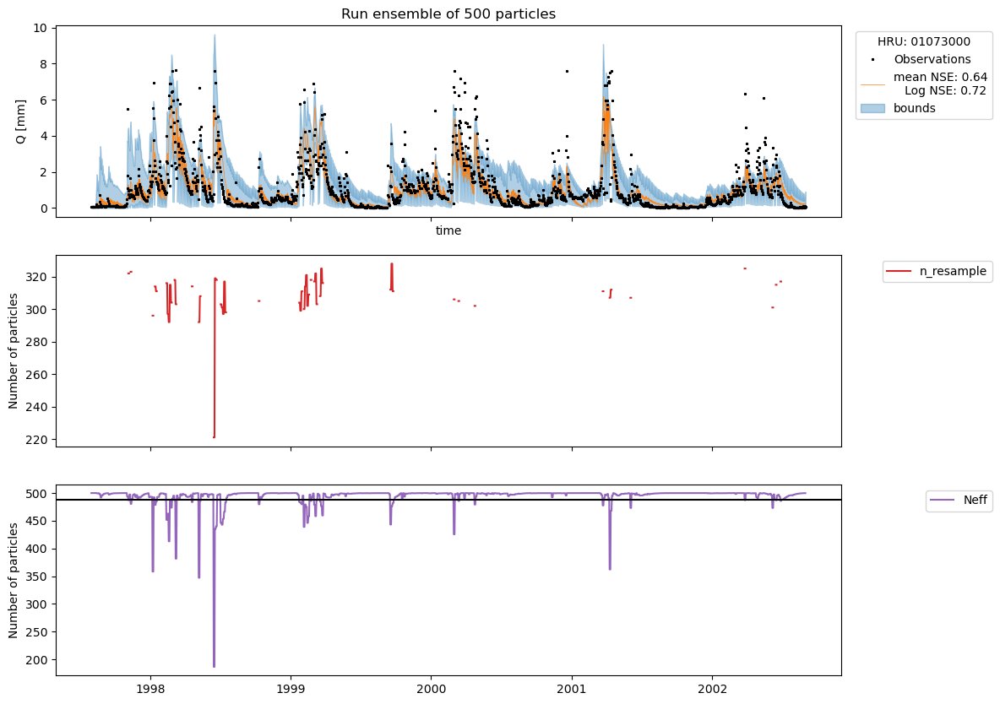

In [99]:
fig, ax = plt.subplots(3,1, figsize=(12,10),sharex=True)
ax[0] = plot_hydrograph(ds_combined, ax[0])
ax[0].legend(title=f"HRU: {ds_combined.attrs['HRU_id']}",bbox_to_anchor=(1.2,1))
for j, val in enumerate(['n_resample','Neff']):
    ax[j+1].plot(ds_combined['time'].values, ds_combined[val].values,color=f"C{j+3}",label=val)
    ax[j+1].legend(bbox_to_anchor=(1.2,1))
    ax[j+1].set_ylabel('Number of particles')
ax[2].axhline(ds_combined.attrs['n_particles']*0.975, color='k');

# another

In [110]:
i = sorted_iter.index( '01013500_2_1e-03')
ds_combined = lst_ds[i]
ds_combined

<xarray.Dataset> Size: 728kB
Dimensions:       (summary_stat: 3, time: 1857)
Coordinates:
  * summary_stat  (summary_stat) <U4 48B 'min' 'max' 'mean'
  * time          (time) datetime64[ns] 15kB 1997-08-01 ... 2002-08-31
Data variables: (12/18)
    Imax          (summary_stat, time) float64 45kB ...
    Ce            (summary_stat, time) float64 45kB ...
    Sumax         (summary_stat, time) float64 45kB ...
    Beta          (summary_stat, time) float64 45kB ...
    Pmax          (summary_stat, time) float64 45kB ...
    Tlag          (summary_stat, time) float64 45kB ...
    ...            ...
    Ss            (summary_stat, time) float64 45kB ...
    Sp            (summary_stat, time) float64 45kB ...
    Q             (summary_stat, time) float64 45kB ...
    Q_obs         (time) float64 15kB 0.4146 0.3886 0.3648 ... 0.1451 0.1321
    Neff          (time) float64 15kB ...
    n_resample    (time) float64 15kB ...
Attributes: (12/13)
    title:              HBV storage & parameter terms data over time for 500 ...
    history:            Storage term results from ewatercycle_HBV.model
    sigma_pp:           0
    sigma_ps:           0
    sigma_w:            2
    sigma_p_Sf:         0.001
    ...                 ...
    n_particles:        500
    HRU_id:             01013500
    p_min_initial:      [1.76032047e+00 4.20279206e-01 9.87717829e+01 6.64444...
    p_max_initial:      [7.21543317e+00 8.49755413e-01 4.30431586e+02 3.91306...
    s_max_initial:      [  6.24743292 257.62926665  39.53689887  27.03295817 ...
    s_min_initial:      [ 1.68977041 61.1386534   9.84480476  2.63550003 56.8...

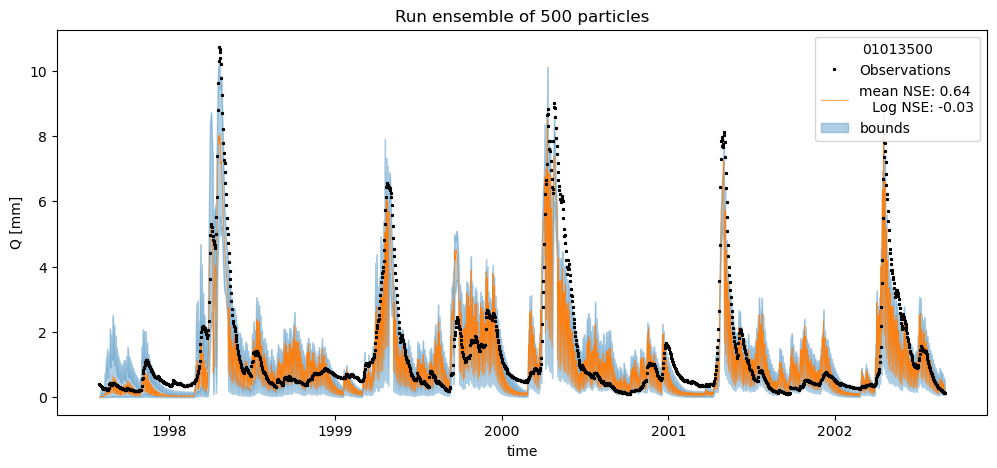

In [111]:
fig, ax = plt.subplots(1,1, figsize=(12,5),sharex=True)
ax = plot_hydrograph(ds_combined, ax)
ax.legend(title=ds_combined.attrs['HRU_id'])
current_time = str(datetime.now())[:-10].replace(":","_")
# fig.savefig(figure_path / f"Ensemble run for {ds_combined.attrs['HRU_id']}_{ds_combined.attrs['n_particles']}_{current_time}.png",bbox_inches="tight", dpi=600)

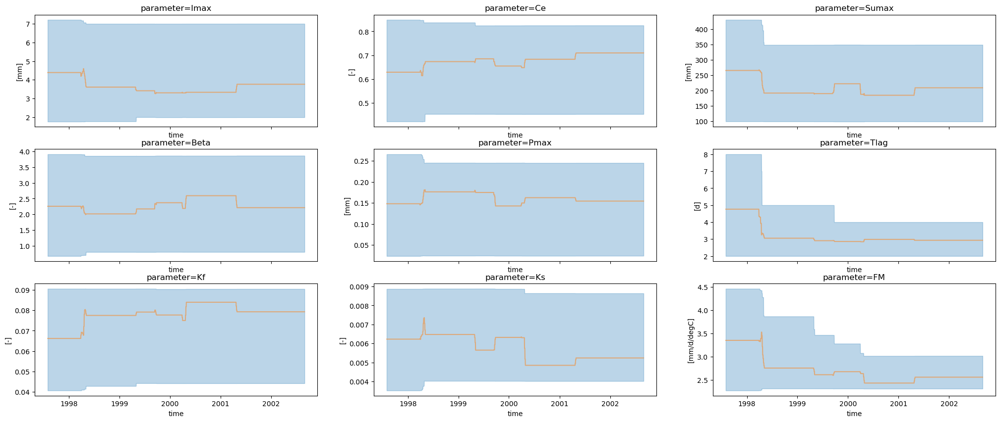

In [112]:
fig, axs = plt.subplots(3,3,figsize=(25,10),sharex=True)
axs = axs.flatten()
for j, parameter in enumerate(param_names):
    ax = axs[j]
    n_particles = ds_combined.attrs['n_particles']
    
    ds_combined[parameter].sel(summary_stat="mean").plot(ax=ax,alpha=0.5,color="C1")
    ax.fill_between(ds_combined.time, 
                     ds_combined[parameter].sel(summary_stat="min").values,
                     ds_combined[parameter].sel(summary_stat="max").values,alpha=0.3, color="C0")
    ax.set_title(f'parameter={parameter}')# for {n_particles} Ensemble Members')
    ax.set_ylabel(f'[{units[param_names[j]]}]')

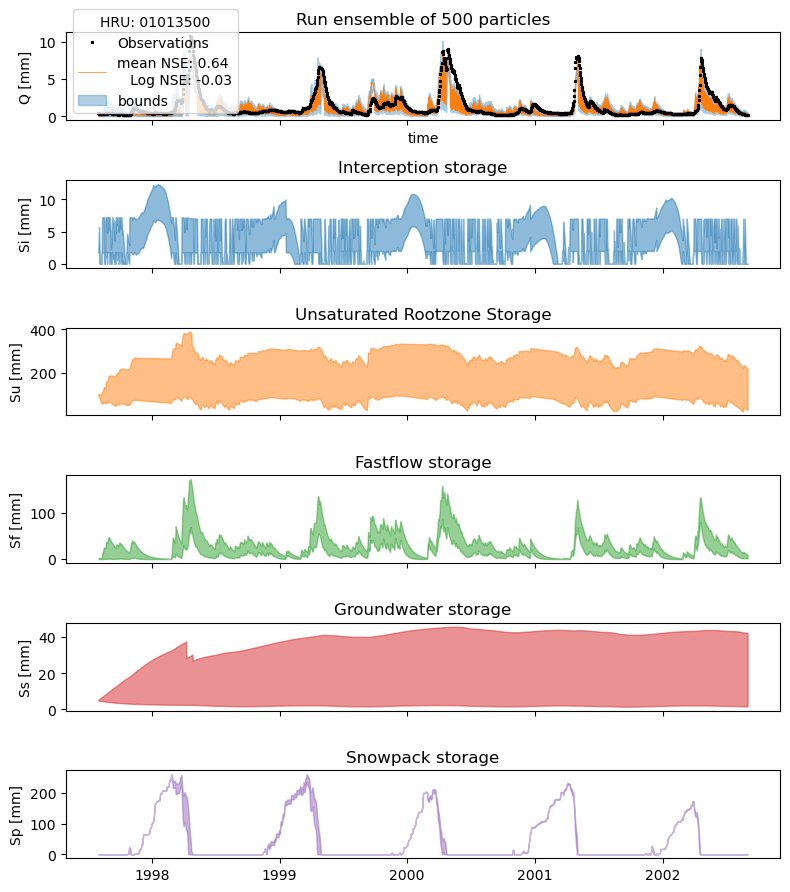

In [113]:
n=6
fig, axs = plt.subplots(n,1,figsize=(8,n*1.5),sharex=True)
plot_variable(ds_combined, stor_names, axs)
fig.tight_layout()
axs[0].legend(title=f"HRU: {ds_combined.attrs['HRU_id']}")
# fig.savefig(figure_path / (str(files[i].name[:-3]) + '_storages.png'), bbox_inches="tight",dpi=400)

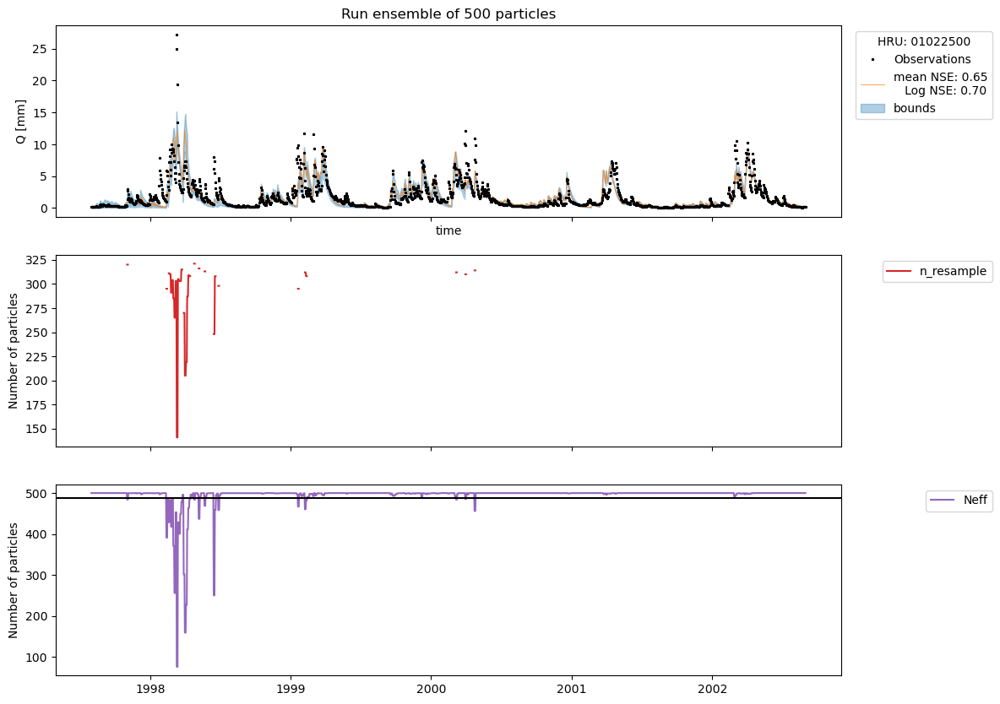

In [104]:
fig, ax = plt.subplots(3,1, figsize=(12,10),sharex=True)
ax[0] = plot_hydrograph(ds_combined, ax[0])
ax[0].legend(title=f"HRU: {ds_combined.attrs['HRU_id']}",bbox_to_anchor=(1.2,1))
for j, val in enumerate(['n_resample','Neff']):
    ax[j+1].plot(ds_combined['time'].values, ds_combined[val].values,color=f"C{j+3}",label=val)
    ax[j+1].legend(bbox_to_anchor=(1.2,1))
    ax[j+1].set_ylabel('Number of particles')
ax[2].axhline(ds_combined.attrs['n_particles']*0.975, color='k');

In [105]:
param_names

['Imax', 'Ce', 'Sumax', 'Beta', 'Pmax', 'Tlag', 'Kf', 'Ks', 'FM']

In [106]:
stor_names

['Si', 'Su', 'Sf', 'Ss', 'Sp']

In [107]:
param_arr = np.zeros((len(lst_ds),2,len(param_names)))
stor_arr = np.zeros((len(lst_ds),2,len(stor_names)))
         
for index, ds_combined in enumerate(lst_ds):
    param_arr[index,0] = ds_combined.attrs['p_min_initial'] 
    param_arr[index,1] = ds_combined.attrs['p_max_initial']
    stor_arr[index,0] = ds_combined.attrs['s_min_initial'] 
    stor_arr[index,1] = ds_combined.attrs['s_max_initial']

In [108]:
param_names_no_su = param_names[:2] + param_names[3:]
param_names_no_su

['Imax', 'Ce', 'Beta', 'Pmax', 'Tlag', 'Kf', 'Ks', 'FM']

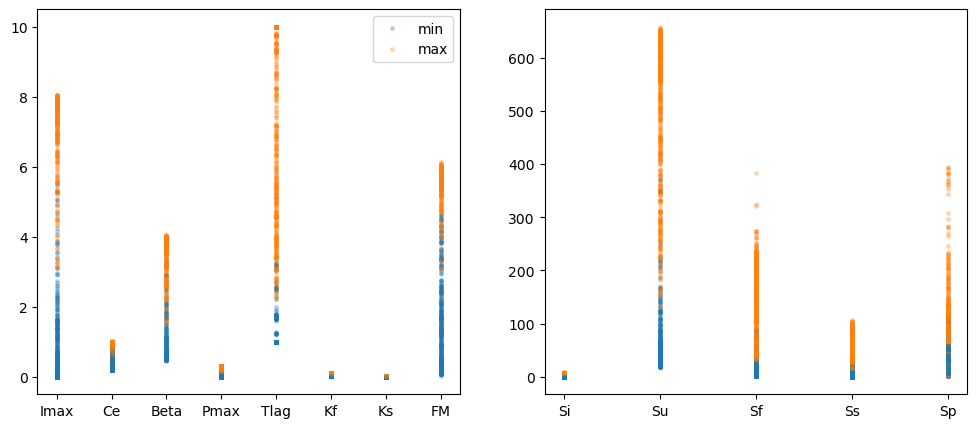

In [109]:
fig, ax = plt.subplots(1,2,figsize=(12,5))
common_kwargs  = {"marker":'o',
                  "lw":0, 
                  "ms": 2.5,
                  "alpha": 0.25,
                 }
for arr in param_arr:
    arr_no_su_0 = list(arr[0][:2]) + list(arr[0][3:])
    ax[0].plot(param_names_no_su, arr_no_su_0, color="C0",label="min",**common_kwargs)
    arr_no_su_1 = list(arr[1][:2]) + list(arr[1][3:])
    ax[0].plot(param_names_no_su, arr_no_su_1, color="C1",label="max",**common_kwargs)

handels, labels = ax[0].get_legend_handles_labels()
ax[0].legend(handels[:2], labels[:2])
for arr in stor_arr:
    ax[1].plot(stor_names, arr[0], color="C0",**common_kwargs)
    ax[1].plot(stor_names, arr[1], color="C1",**common_kwargs)